在这个文档里，将对SPEI数据进行分析。

In [49]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
import xarray as xr
import rioxarray as rxr
%config InlineBackend.figure_format = 'svg'
mpl.rcParams['font.family'] = ['SimSun']

In [50]:
spei_frame = xr.open_dataset('./spei_monthly_2000_2015.nc',decode_coords='all')

In [51]:
spei_frame.loc[dict(month=1)]

<xarray.Dataset>
Dimensions:      (y: 96, x: 84)
Coordinates:
    month        int32 1
  * y            (y) float64 32.04 32.12 32.21 32.29 ... 39.71 39.8 39.88 39.96
  * x            (x) float64 114.0 114.1 114.2 114.3 ... 120.7 120.8 120.9 121.0
    spatial_ref  int32 ...
Data variables:
    spei         (y, x) float32 ...

Text(0, 0.5, '$^\\circ N$')

/home/zyzh0/anaconda3/envs/gis/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
/home/zyzh0/anaconda3/envs/gis/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


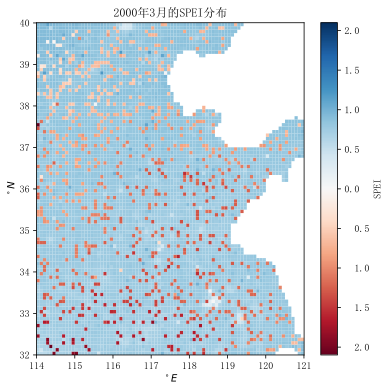

In [52]:
sf=spei_frame.loc[dict(month=3)]

fig,ax = plt.subplots(figsize=(6,6))
sf.spei.plot(ax=ax,cmap='RdBu',cbar_kwargs={'label':'SPEI'})
#ax.set_title('2000年3月的SPEI分布')

ax.set_xlabel('$^\circ E$')
ax.set_ylabel('$^\circ N$')



In [53]:
spei3_frame = xr.open_dataset('./spei_3month_2000_2015.nc',decode_coords='all')

In [54]:
drought_mat = np.empty_like(spei3_frame.loc[dict(month=1)].spei)

flood_mat = np.empty_like(spei3_frame.loc[dict(month=1)].spei)

In [79]:
drought_frames = spei3_frame.where(spei3_frame.spei < -1.5, 9999)
drought_frames = drought_frames.where(drought_frames.spei == 9999, 1)
drought_frames = drought_frames.where(drought_frames.spei == 1, np.nan)

flood_frames = spei3_frame.where(spei3_frame.spei > 1.5, 9999)
flood_frames = flood_frames.where(flood_frames.spei == 9999, 1)
flood_frames = flood_frames.where(flood_frames.spei == 1, np.nan)


Text(0.5, 1.0, '以SPEI-3为标准得到的2000-2015年的干旱发生统计分布，阈值为-1')

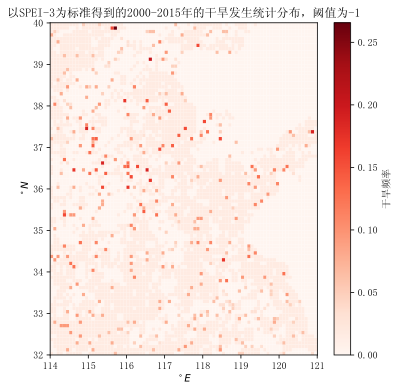

In [80]:
fig,ax = plt.subplots(figsize=(6,6))
(drought_frames.sum(dim='month').spei/64).plot(ax = ax,cmap = "Reds",cbar_kwargs={'label': '干旱频率'})

ax.set_xlabel('$^\circ E$')
ax.set_ylabel('$^\circ N$')
ax.set_title('以SPEI-3为标准得到的2000-2015年的干旱发生统计分布，阈值为-1')

Text(0.5, 1.0, '以SPEI-3为标准得到的2000-2015年的雨涝发生统计分布，阈值为1')

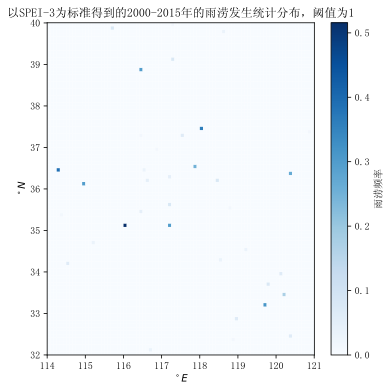

In [81]:
fig,ax = plt.subplots(figsize=(6,6))
(flood_frames.sum(dim='month').spei/64).plot(ax = ax,cmap = "Blues",cbar_kwargs={'label': '雨涝频率'})

ax.set_xlabel('$^\circ E$')
ax.set_ylabel('$^\circ N$')
ax.set_title('以SPEI-3为标准得到的2000-2015年的雨涝发生统计分布，阈值为1')


In [82]:
fig,axs = plt.subplots(figsize=(12,6),nrows=1,ncols=2)
(drought_frames.sum(dim='month').spei/64).plot(ax = axs[0],cmap = "Reds",cbar_kwargs={'label': '干旱频率'})

axs[0].set_xlabel('$^\circ E$')
axs[0].set_ylabel('$^\circ N$')
axs[0].set_title('干旱统计分布')

(flood_frames.sum(dim='month').spei/64).plot(ax = axs[1],cmap = "Blues",cbar_kwargs={'label': '雨涝频率'})

axs[1].set_xlabel('$^\circ E$')
axs[1].set_ylabel('$^\circ N$')
axs[1].set_title('雨涝统计分布')

#fig.suptitle('以SPEI-3为标准得到的2000-2015年的干旱雨涝发生统计分布，阈值为$\pm 1.5$')

Text(0.5, 0.98, '以SPEI-3为标准得到的2000-2015年的干旱雨涝发生统计分布，阈值为$\\pm 1.5$')

In [83]:
chunks = 64*96*84

sp3_array = spei3_frame.spei.to_numpy()
sp3_liear_array = sp3_array.flatten()

df_light_counts = ((sp3_array < -0.5) & (sp3_array >= -1)).sum()
df_medium_counts = ((sp3_array < -1) & (sp3_array >= -1.5)).sum()
df_severe_counts = ((sp3_array < -1.5) & (sp3_array >= -2)).sum()
df_extreme_counts = (sp3_array < -2).sum()

ff_light_counts = ((sp3_array > 0.5) & (sp3_array <= 1)).sum()
ff_medium_counts = ((sp3_array > 1) & (sp3_array <= 1.5)).sum()
ff_severe_counts = ((sp3_array > 1.5) & (sp3_array <= 2)).sum()
ff_extreme_counts = (sp3_array > 2).sum()

df_counts = [df_light_counts,df_medium_counts,df_severe_counts,df_extreme_counts]
ff_counts = [ff_light_counts,ff_medium_counts,ff_severe_counts,ff_extreme_counts]

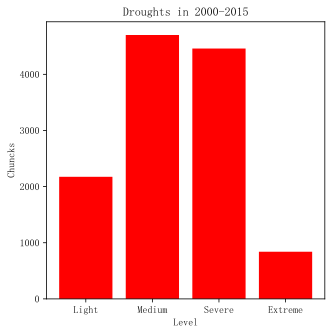

In [84]:
fig,ax = plt.subplots(figsize=(5,5))

ax.bar(['Light','Medium','Severe','Extreme'],df_counts,color='red',label='Droughts')

ax.set_xlabel('Level')
ax.set_ylabel('Chuncks')

ax.title.set_text('Droughts in 2000-2015')

Text(0.5, 1.0, 'Floods in 2000-2015')

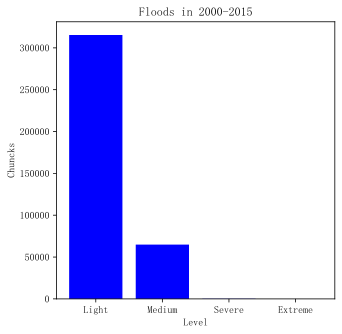

In [85]:
fig,ax = plt.subplots(figsize=(5,5))

ax.bar(['Light','Medium','Severe','Extreme'],ff_counts,color='blue',label='Floods')

ax.set_xlabel('Level')
ax.set_ylabel('Chuncks')

ax.set_title('Floods in 2000-2015')

/tmp/ipykernel_165977/844577622.py:20: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()


Text(0.5, 1.05, '2000-2015年间SPEI概率分布')

/home/zyzh0/anaconda3/envs/gis/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
/home/zyzh0/anaconda3/envs/gis/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


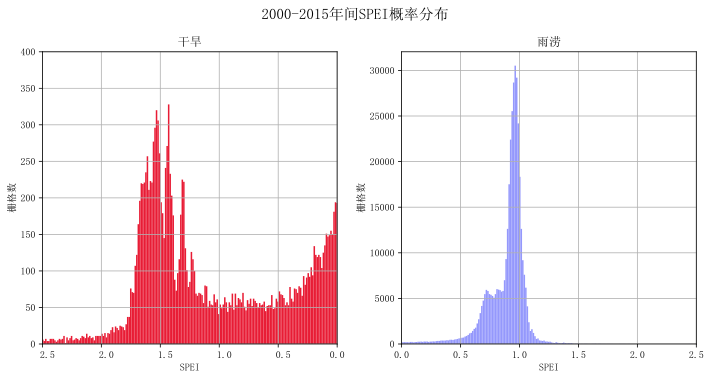

In [86]:
fig,axs = plt.subplots(figsize=(10,5),ncols=2)

axs[1].hist(sp3_liear_array,bins=800,color='#9498fc',label='雨涝')
axs[1].set_xlim(0,2.5)
axs[1].set_xlabel('SPEI')

axs[1].set_ylabel('栅格数')
axs[1].set_title('雨涝')
axs[1].grid()
axs[1].legend()

axs[0].hist(sp3_liear_array,bins=800,color='#e81c35',label='干旱')
axs[0].set_xlim(-2.5,0)
axs[0].set_ylim(0,400)
axs[0].set_xlabel('SPEI')

axs[0].set_ylabel('栅格数')
axs[0].set_title('干旱')
axs[0].grid()
axs[0].legend()

fig.tight_layout()

#fig.suptitle('2000-2015年间SPEI分布',y=1.05,fontsize=15)

In [87]:
droughts_per_3month = []
floods_per_3month = []


for i in sp3_array:
    droughts_per_3month.append(((i < -0.5)).sum())
    floods_per_3month.append(((i > 0.5)).sum())

Text(0.5, 1.05, '2000-2015年间逐月旱涝灾害次数变化')

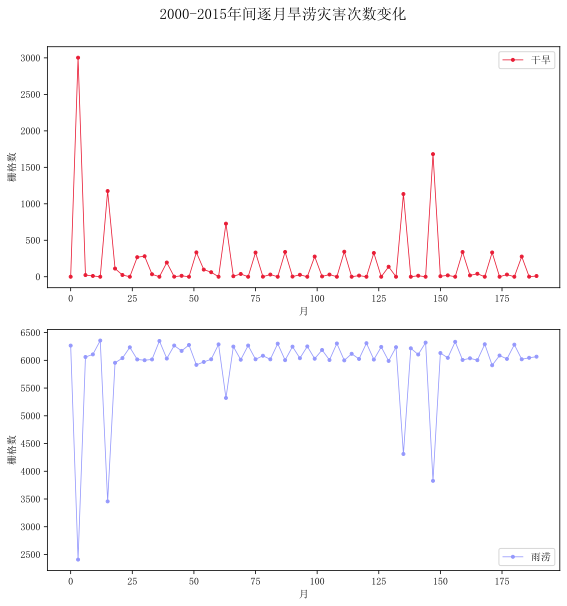

In [88]:
fig,axs = plt.subplots(figsize=(8,8),nrows=2,ncols=1)

months = np.arange(0,192,3)
axs[0].plot(months,droughts_per_3month,"-o",markersize=3,linewidth=0.8,color='#e81c35',label='干旱')

axs[0].set_ylabel('栅格数')
axs[0].set_xlabel('月')
axs[0].legend()

axs[1].plot(months,floods_per_3month,"-o",markersize=3,linewidth=0.8,color='#9498fc',label='雨涝')

axs[1].set_ylabel('栅格数')
axs[1].set_xlabel('月')
axs[1].legend()

fig.tight_layout()

#fig.suptitle('2000-2015年间逐月旱涝灾害次数变化',y=1.05,fontsize=15)